In [4]:
import keras
from keras import Sequential
from keras.layers import *
from keras.models import Model
import tensorflow as tf
from keras.applications.vgg19 import preprocess_input
from keras.applications import VGG19
import tensorflow_datasets as tfds

import numpy as np
import matplotlib.pyplot as plt

In [5]:
BATCH_SIZE = 4

LR_SHAPE = (96, 96, 3)
HR_SHAPE= (384, 384, 3)

# 1.DATA

### Loading the Dataset

In [ ]:
(ds_train, ds_test), info = tfds.load('div2k', with_info=True, split=['train', 'validation'])

### Processing the Dataset

Scaling and resizing

In [7]:
def process(data):
    return tf.image.resize(data['lr'], (LR_SHAPE[0], LR_SHAPE[1]),method=tf.image.ResizeMethod.BICUBIC)/255.0, (tf.image.resize(data['hr'], (HR_SHAPE[0], HR_SHAPE[1]))-127.5)/127.5

train = ds_train.map(process)
test = ds_test.map(process)

In [8]:
train = train.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)
test = test.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

In [9]:
train, test

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None))>)

In [10]:
len(train), len(test)

(200, 25)

### Testing the Dataset

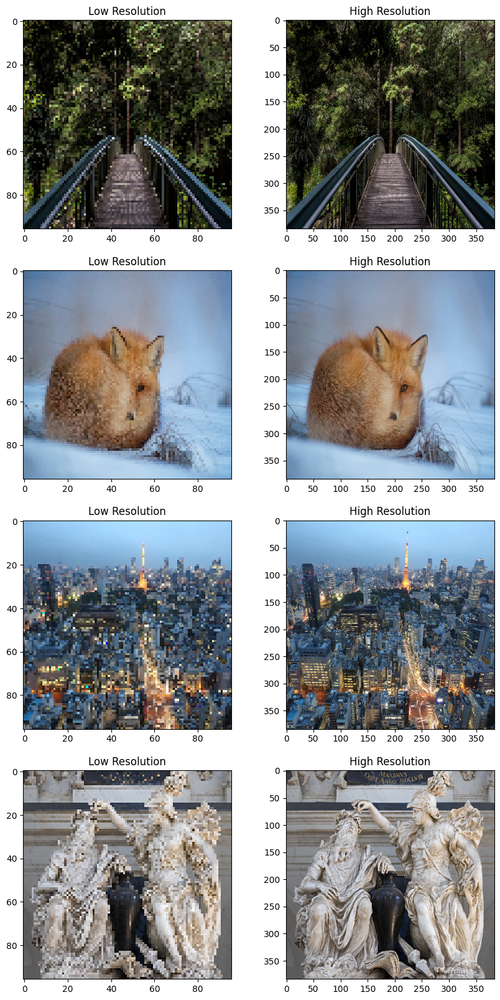

In [22]:
examples = test.as_numpy_iterator().next()

fig, ax = plt.subplots(4, 2, figsize=(10, 20))
for i in range(4):
        ax[i][0].imshow(tf.cast(examples[0][i]*255, dtype=tf.uint8))
        ax[i][0].set_title('Low Resolution')
        ax[i][1].imshow(tf.cast(examples[1][i]*127.5+127.5, dtype=tf.uint8))
        ax[i][1].set_title('High Resolution')

# 2.MODEL

### Building the SRGAN

In [12]:
class SRGAN(Model):
    def __init__(self):
        super(SRGAN, self).__init__()

        self.generator = self.build_generator()                 # Generator model
        self.discriminator = self.build_discriminator()         # Discriminator model


    # Builds the Generator Model
    def build_generator(self):
        # Defines Residual Block
        def ResBlock(inputs):
            x = Conv2D(64, 3, 1, padding='same')(inputs)
            x = BatchNormalization(momentum = 0.5)(x)
            x = LeakyReLU(0.2)(x)

            x = Conv2D(64, 3, 1, padding='same')(x)
            x = BatchNormalization(momentum = 0.5)(x)

            return Add()([x, inputs])

        # Generator
        input = Input(shape=(None, None, 3))

        x = Conv2D(64, 9, 1, padding='same')(input)
        x = LeakyReLU(0.2)(x)

        y = ResBlock(x)             # 16 ResBlock
        for _ in range(15):
            y = ResBlock(y)

        y = Conv2D(64, 3, 1, padding='same')(y)
        y = BatchNormalization(momentum = 0.5)(y)
        y = Add()([y, x])

        y = Conv2D(256, 3, 1, padding='same')(y)
        y = UpSampling2D()(y)
        y = LeakyReLU(0.2)(y)

        y = Conv2D(256, 3, 1, padding='same')(y)
        y = UpSampling2D()(y)
        y = LeakyReLU(0.2)(y)

        out = Conv2D(3, 9, 1, padding='same', activation='tanh')(y)

        return Model(inputs=input, outputs=out)


    # Builds the Discriminator Model
    def build_discriminator(self):
        # Builds the ConvBlock used in discriminator
        def ConvBlock(filters, strides):
            block = Sequential([Conv2D(filters, 3, strides, padding='same'),
                                BatchNormalization(momentum = 0.8),
                                LeakyReLU(0.2)])
            return block

        # Discriminator
        input = Input(shape=HR_SHAPE)

        x = Conv2D(64, 3, 1, padding='same')(input)
        x = LeakyReLU(0.2)(x)

        x = ConvBlock(64, 2)(x)
        x = ConvBlock(128, 1)(x)
        x = ConvBlock(128, 2)(x)
        x = ConvBlock(256, 1)(x)
        x = ConvBlock(256, 2)(x)
        x = ConvBlock(512, 1)(x)
        x = ConvBlock(512, 2)(x)

        x = Flatten()(x)
        x = Dense(1024)(x)
        x = LeakyReLU(0.2)(x)
        out = Dense(1, activation='sigmoid')(x)

        return Model(inputs=input, outputs=out)


    # Custom compile
    def compile(self, disc_opt_func, gen_opt_func, disc_loss_func, gen_loss_func):
        super().compile()
        self.disc_opt = disc_opt_func
        self.gen_opt = gen_opt_func
        self.disc_loss = disc_loss_func
        self.gen_loss = gen_loss_func


    # Custom train
    def train_step(self, data):
        with tf.GradientTape() as disc_tape, tf.GradientTape() as gen_tape:
            generated_images = self.generator(data[0], training=True)               # Image generation

            real_output = self.discriminator(data[1], training=True)                # Discriminator on target data
            fake_output = self.discriminator(generated_images, training=True)       # Discriminator on generated images

            disc_loss_val = self.disc_loss(real_output, fake_output)                # Calculate discriminator loss
            gen_loss_val = self.gen_loss(fake_output, generated_images, data[1])    # Calculate generator loss

            disc_grads = disc_tape.gradient(disc_loss_val, self.discriminator.trainable_variables)  # Calculate discriminator gradients
            gen_grads = gen_tape.gradient(gen_loss_val, self.generator.trainable_variables)         # Calculate generator gradients

            self.disc_opt.apply_gradients(zip(disc_grads, self.discriminator.trainable_variables))  # Optimize discriminator
            self.gen_opt.apply_gradients(zip(gen_grads, self.generator.trainable_variables))        # Optimize generator

        return {"total_loss":gen_loss_val+disc_loss_val, "gen_loss":gen_loss_val, "disc_loss":disc_loss_val}


    # Custom test
    def test_step(self, data):
        generated_images = self.generator(data[0], training=False)              # Image generation

        real_output = self.discriminator(data[1], training=False)               # Discriminator on target data
        fake_output = self.discriminator(generated_images, training=False)      # Discriminator on generated images

        disc_loss_val = self.disc_loss(real_output, fake_output)                # Calculate discriminator loss
        gen_loss_val = self.gen_loss(fake_output, generated_images, data[1])    # Calculate generator loss

        return {"total_loss":gen_loss_val+disc_loss_val, "gen_loss":gen_loss_val, "disc_loss":disc_loss_val}


    # Saves the Generator Model
    def save(self, file_path):
        self.generator.save(file_path)


    def call(self, inputs):
        return self.generator(inputs)       # Return generator's output

In [13]:
model = SRGAN()

### Optimizer and Loss Functions

In [ ]:
gen_opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.9)                # Generator's optimizer
disc_opt = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.9)               # Discriminator's optimizer

def disc_loss(real, fake):                                                          # Discriminator's loss function
    real_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(real), real)
    fake_loss = tf.keras.losses.BinaryCrossentropy()(tf.zeros_like(fake), fake)
    total_loss = real_loss + fake_loss
    return total_loss


vgg = VGG19(input_shape=HR_SHAPE, include_top=False)
vgg_model = Model(inputs=vgg.input, outputs=vgg.layers[10].output)

def vgg_loss(target, generated):                                                    # Vgg loss used in generator's loss function
    target_features = vgg_model((target*127.5+127.5)/255., training=False) / 12.75
    gen_features = vgg_model((generated*127.5+127.5)/255., training=False) / 12.75
    return tf.keras.losses.mean_squared_error(target_features, gen_features)

def gen_loss(fake, generated_image, target_image):                                  # Generator's loss function
    adversarial_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(fake), fake)

    total_loss = adversarial_loss*0.001 + vgg_loss(target_image, generated_image)
    return total_loss

In [15]:
model.compile(disc_opt, gen_opt, disc_loss, gen_loss)

### Training the Model


In [ ]:
model.fit(train, epochs=25, validation_data=test)

### Testing the Model

#### Original Dataset

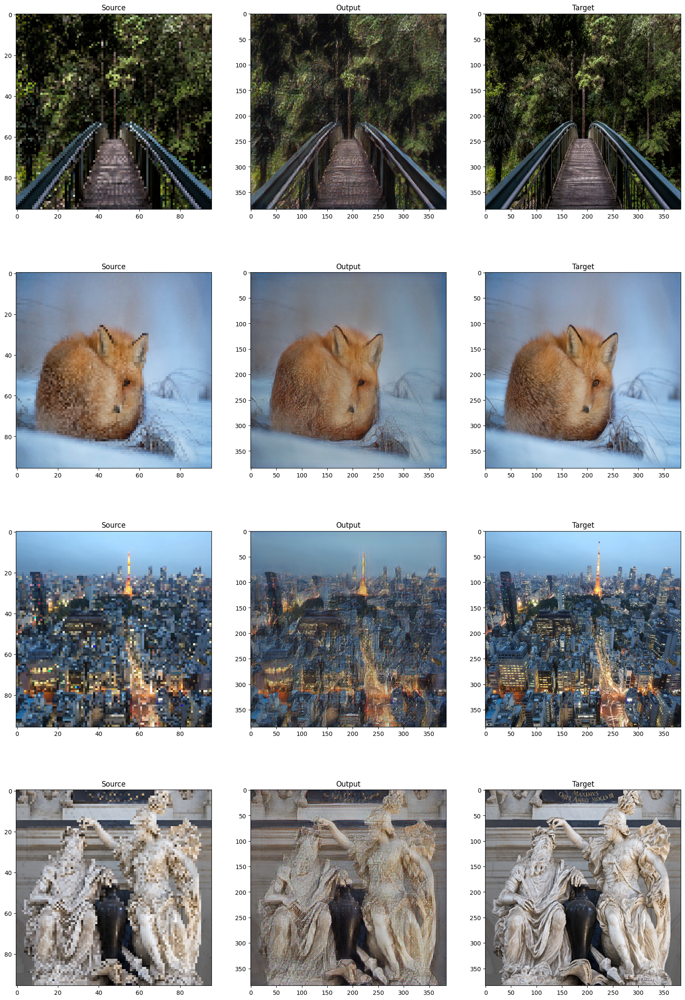

In [17]:
examples = test.as_numpy_iterator().next()
ex_images = model(examples[0], training=False)

fig, ax = plt.subplots(4, 3, figsize=(20, 30))
for i in range(4):
        ax[i][0].imshow(tf.cast(examples[0][i]*255, dtype=tf.uint8))
        ax[i][0].set_title('Source')
        ax[i][1].imshow(tf.cast(ex_images[i]*127.5+127.5, dtype=tf.uint8))
        ax[i][1].set_title('Output')
        ax[i][2].imshow(tf.cast(examples[1][i]*127.5+127.5, dtype=tf.uint8))
        ax[i][2].set_title('Target')

#### Set5 Dataset

##### Loading the Images to Dataset

In [18]:
image_file_paths = ['baby.png', 'bird.png', 'butterfly.png', 'head.png', 'woman.png']

lr_images = []
hr_images = []

for file_path in image_file_paths:
    image = tf.io.read_file(file_path)
    image = tf.image.decode_image(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.uint8)

    lr_image = tf.image.resize(image, (LR_SHAPE[0], LR_SHAPE[1]), method=tf.image.ResizeMethod.BICUBIC)
    lr_image /= 255.
    hr_image = tf.image.resize(image, (HR_SHAPE[0], HR_SHAPE[1]))
    hr_image = (hr_image - 127.5)/127.5

    lr_images.append(lr_image)
    hr_images.append(hr_image)

# Create a TF Dataset
dataset = tf.data.Dataset.from_tensor_slices((lr_images, hr_images)).batch(5)

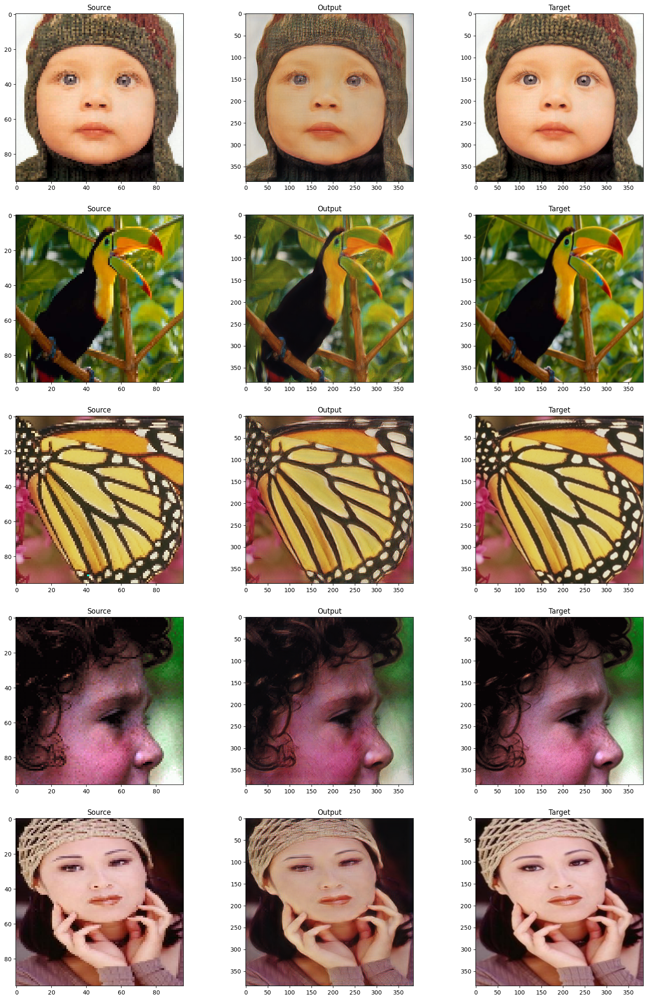

In [19]:
samples = dataset.as_numpy_iterator().next()
images = model(samples[0], training=False)

fig, ax = plt.subplots(5, 3, figsize=(20, 30))
for i in range(5):
        ax[i][0].imshow(tf.cast(samples[0][i]*255, dtype=tf.uint8))
        ax[i][0].set_title('Source')
        ax[i][1].imshow(tf.cast(images[i]*127.5+127.5, dtype=tf.uint8))
        ax[i][1].set_title('Output')
        ax[i][2].imshow(tf.cast(samples[1][i]*127.5+127.5, dtype=tf.uint8))
        ax[i][2].set_title('Target')

### Saving the Generator

In [ ]:
model.save('SRGAN.h5')